#### Initialisation and helper functions

In [1]:
%pip install neurokit2 pyxdf

import neurokit2 as nk
import numpy as np
import pandas as pd
from operator import itemgetter
import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.express as px

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Helper function to get a color from the Plotly color palette
def get_color(i):
    colors = px.colors.qualitative.Plotly
    return colors[i % len(colors)]


# Adapted from Neurokit's read_xdf() to work with the data from this experiment
# https://neuropsychology.github.io/NeuroKit/functions/data.html#neurokit2.data.read_xdf
def read_xdf(filename, upsample=2, fillmissing=None):
    """**Read and tidy an XDF file**

    Reads and tidies an XDF file with multiple streams into a Pandas DataFrame.
    The function outputs both the dataframe and the information (such as the sampling rate).

    Note that, as XDF can store streams with different sampling rates and different time stamps,
    **the function will resample all streams to 2 times (default) the highest sampling rate** (to
    minimize aliasing). The final sampling rate can be found in the ``info`` dictionary.

    .. note::

        This function requires the *pyxdf* module to be installed. You can install it with
        ``pip install pyxdf``.

    Parameters
    ----------
    filename :  str
        Path (with the extension) of an XDF file (e.g., ``"data.xdf"``).
    upsample : float
        Factor by which to upsample the data. Default is 2, which means that the data will be
        resampled to 2 times the highest sampling rate. You can increase that to further reduce
        edge-distortion, especially for high frequency signals like EEG.
    fillmissing : float
        The maximum duration in seconds of missing data to fill. ``None`` (default) will
        interpolate all missing values and prevent issues with NaNs. However, it might be important
        to keep the missing intervals (e.g., ``fillmissing=1`` to keep interruptions of more than
        1 s) typically corresponding to signal loss or streaming interruptions and exclude them
        from further analysis.

    Returns
    ----------
    df : DataFrame, dict
        The BITalino file as a pandas dataframe if one device was read, or a dictionary
        of pandas dataframes (one dataframe per device) if multiple devices are read.
    info : dict
        The metadata information containing the sampling rate(s).

    See Also
    --------
    .read_bitalino, .signal_resample

    Examples
    --------
    .. ipython:: python

      import neurokit2 as nk

      # data, info = nk.read_xdf("data.xdf")
      # sampling_rate = info["sampling_rate"]
    """

    def get_markers(markers_stream):
        markers = markers_stream['time_series']
        assert all(len(marker) == 1 for marker in markers), 'Warning: There is an event containing more than one marker'
        markers = [marker[0] for marker in markers]

        # Only keep unique markers occurring in expected order
        relevant_indices = []
        expected_marker_order = ['app-start', 'cookies-start', 'cookies-end', 'geolocation-start', 'geolocation-end', 'confirmshaming-start', 'confirmshaming-end', 'personalDetails-start', 'confusingCheckbox-start', 'confusingCheckbox-end', 'personalDetails-end', "creditCard-start", "creditCard-end", 'id-start', "cameraPermission-start", "cameraPermission-end", 'id-end', 'app-end']
        previous_index = 0
        for marker in expected_marker_order:
            if marker in markers[previous_index:]:
                index = markers.index(marker, previous_index)
                relevant_indices.append(index)
                previous_index = index
            else:
                print(f'Missing marker: {marker}')

        timestamps = itemgetter(*relevant_indices)(markers_stream['time_stamps'])
        markers = itemgetter(*relevant_indices)(markers)
        return markers, timestamps

    try:
        import pyxdf
    except ImportError:
        raise ImportError(
            "The 'pyxdf' module is required for this function to run. ",
            "Please install it first (`pip install pyxdf`).",
        )

    # Load file
    streams, header = pyxdf.load_xdf(filename)

    # Remove any empty streams
    streams = [stream for stream in streams if int(stream['footer']['info']['sample_count'][0])]

    # Process markers stream first
    markers_stream = next(filter(lambda stream: isinstance(stream['time_series'], list), streams))
    streams.remove(markers_stream)
    markers, timestamps = get_markers(markers_stream)

    # Get the smallest time stamp ('app-start') to later use as offset (zero point) as well as the largest timestamp ('app-end') to cut off data
    offset = min(timestamps)
    max_ts = max(timestamps) - offset

    # timestamps, markers = zip(*[(ts, [marker]) for ts, marker in zip(timestamps, markers) if first_timestamp <= ts <= last_timestamp])
    markers_df = pd.DataFrame(markers, columns=['marker'])
    markers_df.index = pd.to_datetime(timestamps - offset, unit="s")

    # Process other streams and convert to dataframes
    dfs = []
    for stream in streams:
        channels_info = stream["info"]["desc"][0]["channels"][0]["channel"]
        cols = [channels_info[i]["label"][0] for i in range(len(channels_info))]
        dat = pd.DataFrame(stream["time_series"], columns=cols)

        # Get time stamps and offset from minimum time stamp
        dat.index = pd.to_datetime(stream["time_stamps"] - offset, unit="s")
        dfs.append(dat)

    # Store info of each stream ----------------------------------------------------------------
    # Store metadata
    info = {
        "sampling_rates_original": [float(s["info"]["nominal_srate"][0]) for s in streams],
        "sampling_rates_effective": [float(s["info"]["effective_srate"]) for s in streams],
        "datetime": header["info"]["datetime"][0],
        "data": dfs,
    }

    # Synchronize ------------------------------------------------------------------------------
    # Merge all dataframes by timestamps
    # Note: this is a critical steps, as it inserts timestamps and makes it non-evenly spread
    streams_df = dfs[0]
    for i in range(1, len(dfs)):
        streams_df = pd.merge(streams_df, dfs[i], how="outer", left_index=True, right_index=True)
    streams_df = streams_df.sort_index()

    # Resample and Interpolate -----------------------------------------------------------------
    # Final sampling rate will be 2 times the maximum sampling rate
    # (to minimize aliasing during interpolation)
    info["sampling_rate"] = int(np.max(info["sampling_rates_original"]) * upsample)

    if fillmissing is not None:
        fillmissing = int(info["sampling_rate"] * fillmissing)

    # Create new index with evenly spaced timestamps
    idx = pd.date_range(streams_df.index.min().floor(freq='s'), streams_df.index.max(), freq=str(1000 / info["sampling_rate"]) + "ms")
    # https://stackoverflow.com/questions/47148446/pandas-resample-interpolate-is-producing-nans
    streams_df = streams_df.reindex(streams_df.index.union(idx))

    # Interpolate numeric columns across the new index
    streams_df = streams_df.interpolate(method="index", limit=fillmissing)

    # Drop the old timestamp indices
    streams_df = streams_df.reindex(idx)

    # Cut off data before first marker and after last marker
    streams_df = streams_df[(streams_df.index >= pd.to_datetime(0)) & (streams_df.index <= pd.to_datetime(max_ts, unit='s'))]

    # Make timestamps more readable
    # df.index = df.index.strftime('%M:%S.%f').str[:-3]

    return streams_df, markers_df, info


# Helper function to plot streams and markers using plotly
def plot_data(streams_df, markers_df, title=None, hide_end_markers=False):
    upper_fig = go.Figure()

    # Streams
    for i, col in enumerate(streams_df):
        trace = go.Scatter(x=streams_df.index, y=streams_df[col], mode='lines', name=col, yaxis=f'y{i + 1}',
                           line=dict(color=get_color(i)))
        upper_fig.add_trace(trace)

    # Markers
    filtered_markers_df = markers_df.loc[markers_df.marker.str.endswith('-start')] if hide_end_markers else markers_df
    upper_fig.add_trace(go.Scatter(x=filtered_markers_df.index, y=[0] * len(filtered_markers_df), yaxis=f'y{len(streams_df.columns) + 1}',
                                   mode='markers',
                                   marker=dict(symbol='diamond-tall', line=dict(color='black', width=2), color='yellow',
                                               size=14),
                                   customdata=filtered_markers_df[[*filtered_markers_df][1:-1]],
                                   showlegend=True,
                                   name='Start Markers' if hide_end_markers else 'Markers',
                                   hovertext=[' : '.join(map(str, i)) for i in
                                              zip(filtered_markers_df.index.strftime("%M:%S:%f"), filtered_markers_df.marker)],
                                   hoverinfo='text',
                                   ))

    layout = go.Layout(
        margin=dict(b=0, pad=0),
        title=title,
        legend=dict(orientation="h", y=1.1, x=0.5, xanchor='center', yanchor='bottom'),
        xaxis=dict(
            title=dict(
                text='Time',
                standoff=0),
            tickformat="%M:%S:%f", range=[markers_df.index.min(), markers_df.index.max()],
            side='top'),
        hovermode="x unified",
        **{f'yaxis{len(streams_df.columns) + 1}': dict(title=dict(standoff=0), overlaying='y', visible=False, range=[-0.05, 1])},

        **{f'yaxis{i + 1}': dict(title=dict(text=col, standoff=0), overlaying='y' if i > 0 else None,
                                 visible=False,
                                 color=get_color(i)) for i, col in enumerate(streams_df)},
    )


    upper_fig.update_layout(layout)

    # Markers as Gantt chart
    marker_prefixes = markers_df.marker.str.split('-').str[0].unique()

    def get_timestamp(marker_prefix, marker_suffix):
        matches = markers_df.loc[markers_df.marker.eq(f'{marker_prefix}-{marker_suffix}')]
        if matches.empty:
            if marker_suffix == 'start':
                return markers_df.index[0]
            else:
                return markers_df.index[-1]
        return matches.index[0]

    d = [dict(marker=marker_prefix, start=get_timestamp(marker_prefix, 'start'),
              end=get_timestamp(marker_prefix, 'end')) for marker_prefix in marker_prefixes]
    gantt_fig = px.timeline(d, x_start='start', x_end='end', y='marker', color='marker')
    gantt_fig.update_layout(
        legend=dict(y=-0.1, x=0.5, orientation="h", xanchor='center'),
        margin=dict(t=0, pad=0), xaxis=dict(title=dict(
            text='Time',
            standoff=0), tickformat="%M:%S:%f", range=[markers_df.index.min(), markers_df.index.max()]),
        yaxis=dict(showticklabels=False, title='Markers'))

    pyo.iplot(upper_fig)
    pyo.iplot(gantt_fig)

#### Loading and preparing the data in the file

In [3]:
# Read file
streams_df, markers_df, info = read_xdf('data/sub-001/sub-001.xdf', upsample=2)

Stream 3: Calculated effective sampling rate 59.9284 Hz is different from specified rate 90.0000 Hz.


In [4]:
# Clean up the streams

# Rename some columns for clarity
rename_columns = {'RAW0': 'PPG', 'EDABITREV1': 'EDA', 'ECGBIT2': 'ECG'}
streams_df = streams_df.rename(columns=rename_columns)

# Keep only the columns we want
columns_to_keep = [*rename_columns.values(),
                   # 'left_pupil_validity', 'right_pupil_validity', 'left_pupil_diameter', 'right_pupil_diameter'
                    ]
streams_df = streams_df[columns_to_keep]

In [5]:
streams_df

,PPG,EDA,ECG
1970-01-01 00:00:00.000,442.162567,15.720000,0.001015
1970-01-01 00:00:00.005,431.126312,15.720000,-0.006334
1970-01-01 00:00:00.010,420.625946,15.720000,-0.045836
1970-01-01 00:00:00.015,410.821930,15.720000,-0.049359
1970-01-01 00:00:00.020,401.821625,15.720000,-0.011358
...,...,...,...
1970-01-01 00:00:50.660,507.458160,18.260000,0.088763
1970-01-01 00:00:50.665,532.154175,18.251863,0.110120
1970-01-01 00:00:50.670,558.155029,18.241863,0.133621
1970-01-01 00:00:50.675,587.817566,18.240000,0.110335


In [6]:
# Remove the first and last marker
# markers_df = markers_df[~markers_df.marker.isin(['app-start', 'app-end'])]
# markers_df

In [7]:
plot_data(streams_df, markers_df, title='Raw Channel Data', hide_end_markers=True)

#### PPG data

,PPG_Raw,PPG_Clean,PPG_Rate,PPG_Peaks
0,442.162567,-71.155427,93.807107,0
1,431.126312,-80.772803,93.807107,0
2,420.625946,-90.212137,93.807107,0
3,410.821930,-99.338715,93.807107,0
4,401.821625,-108.030762,93.807107,0
...,...,...,...,...
10132,507.458160,-157.519574,94.488189,0
10133,532.154175,-143.946218,94.488189,0
10134,558.155029,-129.518702,94.488189,0
10135,587.817566,-114.576160,94.488189,0


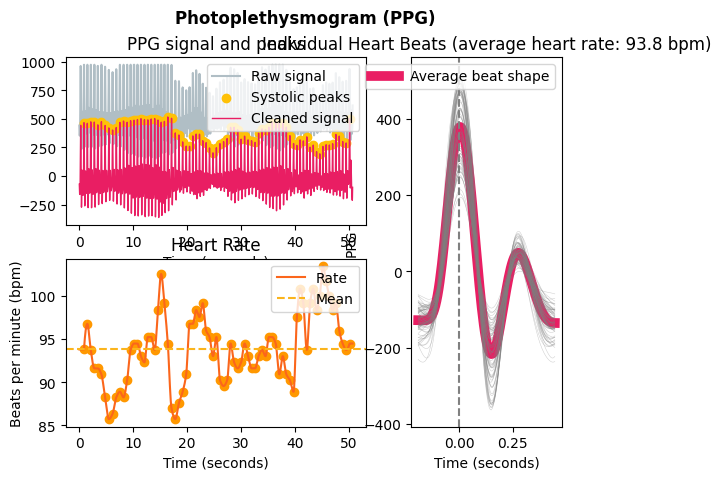

In [8]:
# Process PPG signal
ppg_signals, ppg_info = nk.ppg_process(streams_df['PPG'], sampling_rate=info["sampling_rate"])

# Plot PPG
nk.ppg_plot(ppg_signals, ppg_info)
ppg_signals

In [9]:
# Drop PPG column of streams_df
streams_df.drop(columns='PPG', inplace=True)

# Add bpm (heart rate) column to streams_df
ppg_signals.index = streams_df.index
streams_df['PPG_Rate'] = ppg_signals['PPG_Rate']

streams_df

,EDA,ECG,PPG_Rate
1970-01-01 00:00:00.000,15.720000,0.001015,93.807107
1970-01-01 00:00:00.005,15.720000,-0.006334,93.807107
1970-01-01 00:00:00.010,15.720000,-0.045836,93.807107
1970-01-01 00:00:00.015,15.720000,-0.049359,93.807107
1970-01-01 00:00:00.020,15.720000,-0.011358,93.807107
...,...,...,...
1970-01-01 00:00:50.660,18.260000,0.088763,94.488189
1970-01-01 00:00:50.665,18.251863,0.110120,94.488189
1970-01-01 00:00:50.670,18.241863,0.133621,94.488189
1970-01-01 00:00:50.675,18.240000,0.110335,94.488189


#### EDA data

,EDA_Raw,EDA_Clean,EDA_Tonic,EDA_Phasic,SCR_Onsets,SCR_Peaks,SCR_Height,SCR_Amplitude,SCR_RiseTime,SCR_Recovery,SCR_RecoveryTime
0,15.720000,15.717945,15.955034,-0.237088,0,0,0.0,0.0,0.0,0,0.0
1,15.720000,15.719465,15.955377,-0.235911,0,0,0.0,0.0,0.0,0,0.0
2,15.720000,15.721001,15.955720,-0.234717,0,0,0.0,0.0,0.0,0,0.0
3,15.720000,15.722552,15.956063,-0.233510,0,0,0.0,0.0,0.0,0,0.0
4,15.720000,15.724114,15.956407,-0.232291,0,0,0.0,0.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
10132,18.260000,18.249335,17.871093,0.003528,0,0,0.0,0.0,0.0,0,0.0
10133,18.251863,18.249263,17.871093,0.003258,0,0,0.0,0.0,0.0,0,0.0
10134,18.241863,18.249201,17.871093,0.002999,0,0,0.0,0.0,0.0,0,0.0
10135,18.240000,18.249149,17.871093,0.002751,0,0,0.0,0.0,0.0,0,0.0


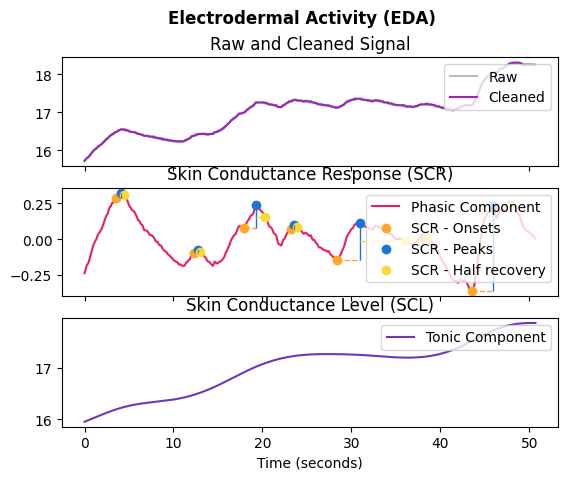

In [10]:
# Process EDA signal
eda_signals, eda_info = nk.eda_process(streams_df['EDA'], sampling_rate=info["sampling_rate"])

# Plot EDA
nk.eda_plot(eda_signals, eda_info)
eda_signals

In [11]:
# Keep only the columns we want
columns_to_keep = ['EDA_Clean', 'EDA_Tonic', 'EDA_Phasic']
eda_signals = eda_signals[columns_to_keep]

# Drop old EDA column of streams_df
streams_df.drop(columns=streams_df.filter(['EDA']), inplace=True)

# Add processed EDA columns to streams_df
eda_signals.index = streams_df.index
streams_df = pd.concat([streams_df, eda_signals], axis=1)

#### ECG data

,ECG_Raw,ECG_Clean,ECG_Rate,ECG_Quality,ECG_R_Peaks,ECG_P_Peaks,ECG_P_Onsets,ECG_P_Offsets,ECG_Q_Peaks,ECG_R_Onsets,ECG_R_Offsets,ECG_S_Peaks,ECG_T_Peaks,ECG_T_Onsets,ECG_T_Offsets,ECG_Phase_Atrial,ECG_Phase_Completion_Atrial,ECG_Phase_Ventricular,ECG_Phase_Completion_Ventricular
0,0.001015,-0.046191,93.825180,0.944909,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,NaN,0.000000
1,-0.006334,-0.059528,93.825180,0.944909,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,NaN,0.000000
2,-0.045836,-0.069576,93.825180,0.944909,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,NaN,0.000000
3,-0.049359,-0.074367,93.825180,0.944909,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,NaN,0.000000
4,-0.011358,-0.076389,93.825180,0.944909,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10132,0.088763,0.023718,94.488189,0.000000,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,1.0,0.941176
10133,0.110120,0.028748,94.488189,0.000000,0,0,0,0,0,0,0,0,1,0,0,NaN,0.0,1.0,0.960784
10134,0.133621,0.025431,94.488189,0.000000,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,1.0,0.980392
10135,0.110335,0.010490,94.488189,0.000000,0,0,0,0,0,0,0,0,0,0,0,NaN,0.0,1.0,1.000000


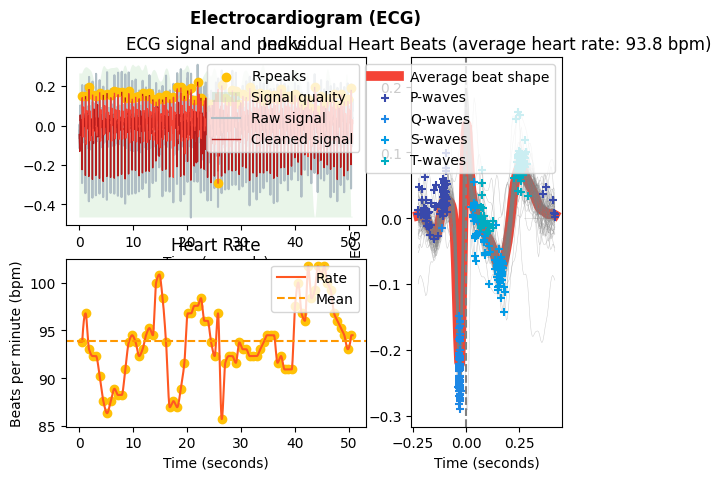

In [12]:
# Process ECG signal
ecg_signals, ecg_info = nk.ecg_process(streams_df['ECG'], sampling_rate=info["sampling_rate"])

# Plot ECG
nk.ecg_plot(ecg_signals, ecg_info)
ecg_signals

In [13]:
# Keep only the columns we want
ecg_signals = ecg_signals[['ECG_Quality', 'ECG_Rate']]

# Drop old ECG column of streams_df
streams_df.drop(columns=streams_df.filter(['ECG']), inplace=True)

# Add processed EDA columns to streams_df
ecg_signals.index = streams_df.index
streams_df = pd.concat([streams_df, ecg_signals], axis=1)

In [14]:
plot_data(streams_df, markers_df, title='Processed Channel Data', hide_end_markers=True)

In [15]:
# epochs = nk.epochs_create(ppg_signals, events=[5000, 10000, 15000],
#                           epochs_start=-0.1, epochs_end=1.9)
# nk.ppg_analyze(epochs, sampling_rate=info["sampling_rate"])